# Визуализация данных 

In [48]:
%load_ext nb_black
%matplotlib inline

import IPython
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

In [34]:
print("Доступные стили:\n\t{}".format("\n\t".join(plt.style.available)))

Доступные стили:
	Solarize_Light2
	_classic_test_patch
	_mpl-gallery
	_mpl-gallery-nogrid
	bmh
	classic
	dark_background
	fast
	fivethirtyeight
	ggplot
	grayscale
	seaborn-v0_8
	seaborn-v0_8-bright
	seaborn-v0_8-colorblind
	seaborn-v0_8-dark
	seaborn-v0_8-dark-palette
	seaborn-v0_8-darkgrid
	seaborn-v0_8-deep
	seaborn-v0_8-muted
	seaborn-v0_8-notebook
	seaborn-v0_8-paper
	seaborn-v0_8-pastel
	seaborn-v0_8-poster
	seaborn-v0_8-talk
	seaborn-v0_8-ticks
	seaborn-v0_8-white
	seaborn-v0_8-whitegrid
	tableau-colorblind10


<IPython.core.display.Javascript object>

In [27]:
plt.rc("figure", figsize=(6, 4))
plt.rc("font", size=12)
plt.style.use("fivethirtyeight")
plt.style.use("default")

sns.set(style="whitegrid", palette="muted")

<IPython.core.display.Javascript object>

In [25]:
IPython.display.display(IPython.display.Markdown("$e^{{4}}$ = {}".format(np.exp(4))))

$e^{4}$ = 54.598150033144236

<IPython.core.display.Javascript object>

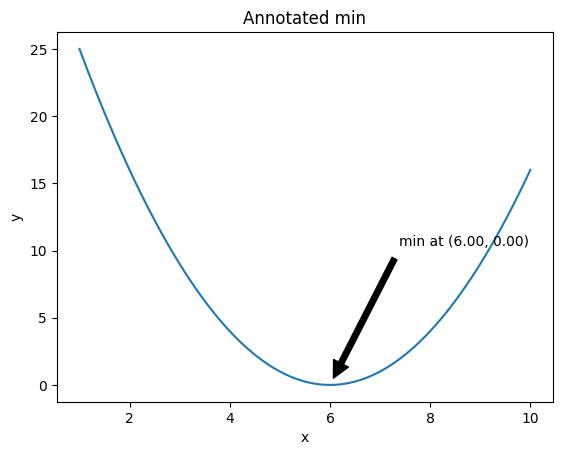

<IPython.core.display.Javascript object>

In [28]:
def Annotated_min(x, y):
    argmin_y = np.argmin(y)
    min_y = y[argmin_y]
    min_x = x[argmin_y]

    plt.title("Annotated min")
    plt.plot(x, y)
    plt.xlabel("x")
    plt.ylabel("y")
    plt.annotate(
        f"min at ({min_x:.2f}, {min_y:.2f})",
        xy=(min_x, min_y),
        xytext=(50, 100),
        textcoords="offset points",
        arrowprops=dict(facecolor="black", shrink=0.05),
    )


x = np.linspace(1, 10, int(1 + (10 - 1) / 0.1))
y = (x - 6) ** 2
GridSearchLambda(x, y)

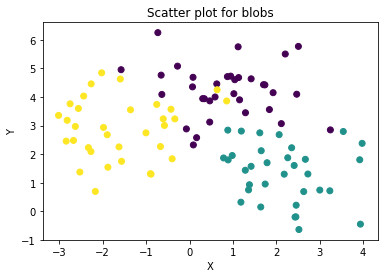

In [4]:
from sklearn.datasets.samples_generator import make_blobs

X, y = make_blobs(n_samples=100, centers=3, n_features=2, random_state=0)

plt.title("Scatter plot for blobs")
plt.xlabel("X")
plt.ylabel("Y")
plt.scatter(X[:, 0], X[:, 1], c=y);

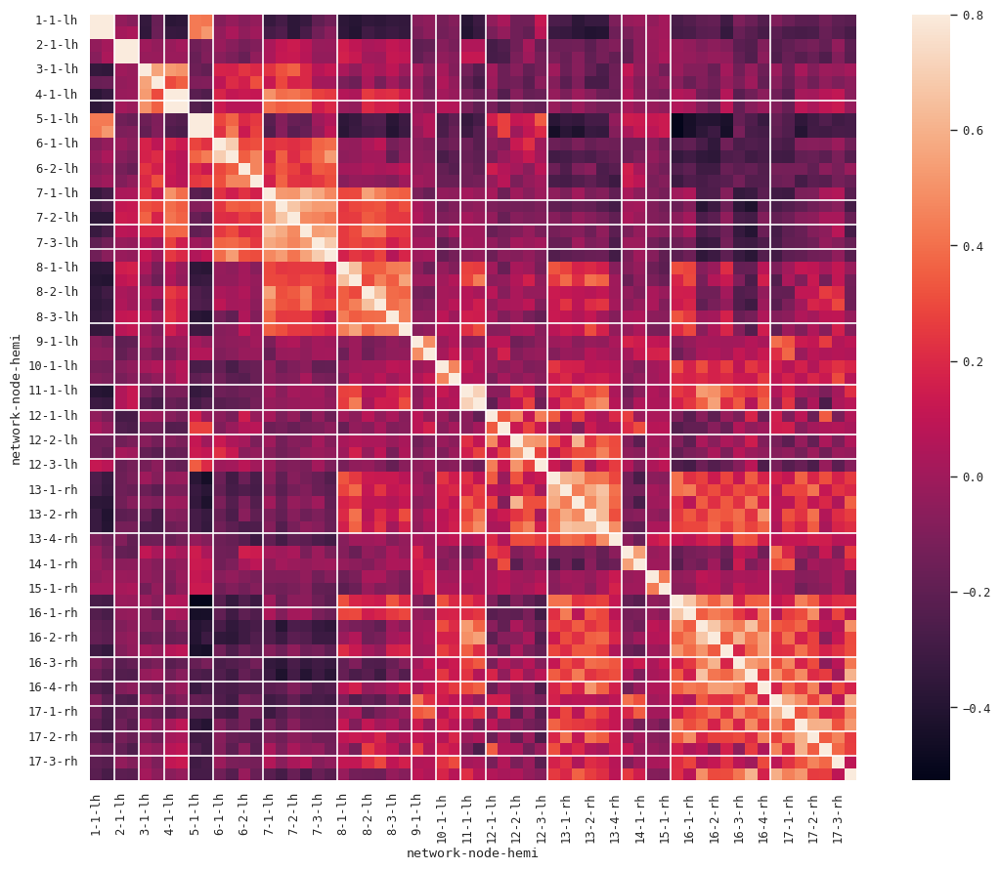

<IPython.core.display.Javascript object>

In [39]:
sns.set(context="paper", font="monospace")

df = sns.load_dataset("brain_networks", header=[0, 1, 2], index_col=0)
corrmat = df.corr()
f, ax = plt.subplots(figsize=(12, 9))

sns.heatmap(corrmat, vmax=0.8, square=True)

# Use matplotlib directly to emphasize known networks
networks = corrmat.columns.get_level_values("network")
for i, network in enumerate(networks):
    if i and network != networks[i - 1]:
        ax.axhline(len(networks) - i, c="w")
        ax.axvline(i, c="w")
f.tight_layout()

Иногда полезно проводить линии через данные, чтобы лучше понимать зависимости

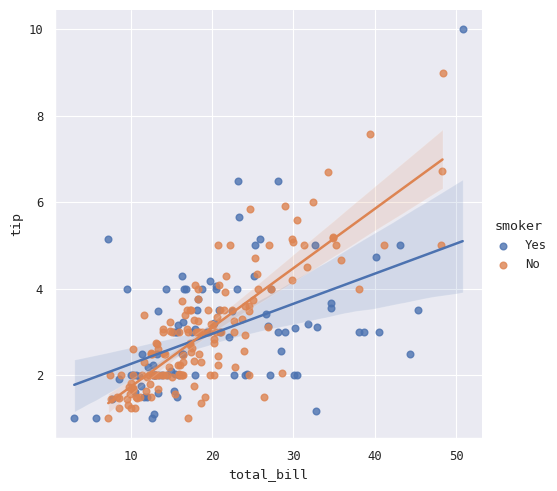

<IPython.core.display.Javascript object>

In [42]:
tips = sns.load_dataset("tips")
sns.lmplot(x="total_bill", y="tip", hue="smoker", data=tips)

### Набор точек на прямой

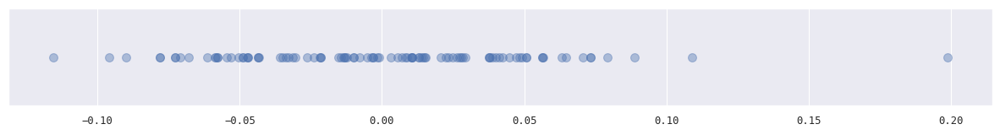

<IPython.core.display.Javascript object>

In [51]:
diabetes = sklearn.datasets.load_diabetes()
X = diabetes.data
points = np.random.choice(X[:, 5], 100)


plt.figure(figsize=(15, 1.5))
plt.grid(True, axis="x")
plt.yticks([])
plt.scatter(points, np.zeros(len(points)), s=50, alpha=0.4)

### Jitter: случайно выбираем вертикальную координату, чтобы лучше видеть количество точек

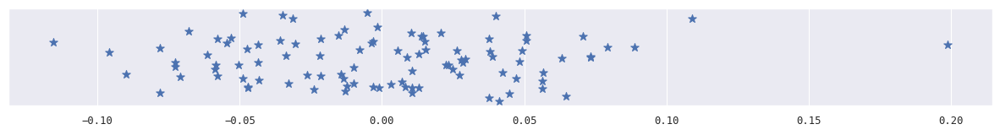

<IPython.core.display.Javascript object>

In [53]:
plt.figure(figsize=(15, 1.5))
plt.grid(True, axis="x")
plt.yticks([])
plt.scatter(points, np.random.randn(len(points)), s=50, marker="*")

### Гистограмма

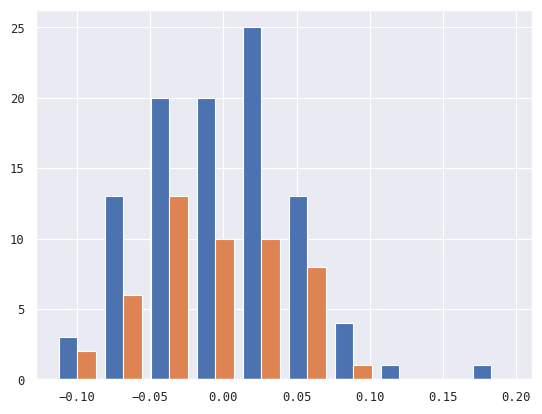

<IPython.core.display.Javascript object>

In [55]:
plt.hist([points, points[::2]])

###  Логарифмическая шкала

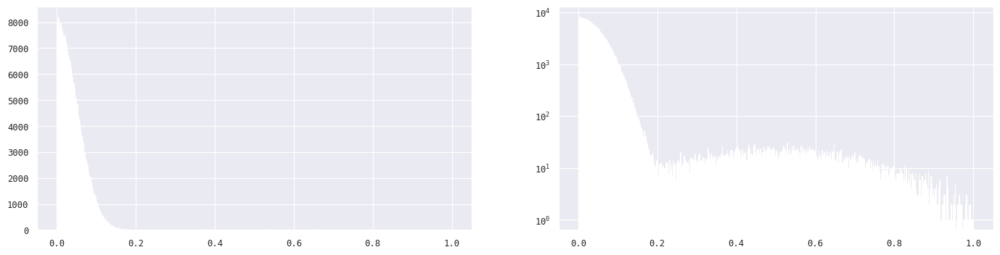

<IPython.core.display.Javascript object>

In [57]:
arr = np.concatenate(
    (
        np.random.normal(loc=0, scale=0.05, size=1000000),
        np.random.normal(loc=0.5, scale=0.2, size=10000),
    )
)
plt.figure(figsize=(17, 4))
plt.subplot(1, 2, 1)
plt.hist(arr, bins=np.linspace(0, 1.0, 1000))
ax = plt.subplot(1, 2, 2)
plt.hist(arr, bins=np.linspace(0, 1.0, 1000), log=True)

plt.show()

### 2D-гистограмма

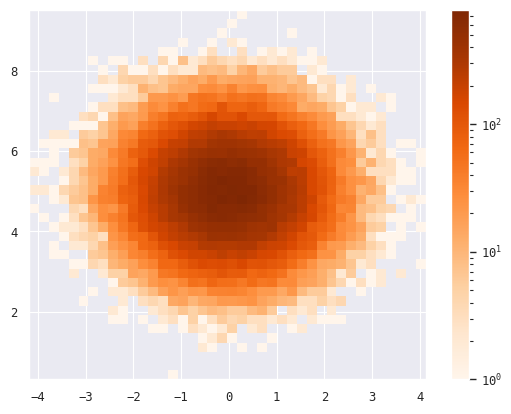

<IPython.core.display.Javascript object>

In [59]:
from matplotlib.colors import LogNorm

x = np.random.randn(100000)
y = np.random.randn(100000) + 5

plt.hist2d(x, y, bins=40, norm=LogNorm(), cmap=plt.cm.Oranges)
plt.colorbar()
plt.show()

### KDE: Kernel Density Estimation

Пример: [Simple 1D Kernel Density Estimation](http://scikit-learn.org/stable/auto_examples/neighbors/plot_kde_1d.html)

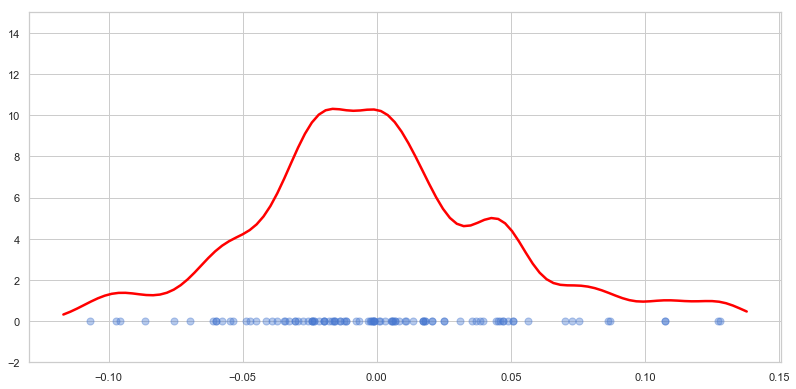

In [31]:
from scipy.stats import gaussian_kde
from ipywidgets import interact

sns.set(style="whitegrid", palette="muted")

diabetes = datasets.load_diabetes()
X = diabetes.data
points1 = random.choice(X[:, 5], 100)


def plot_gaussian_kde(width):
    plt.figure(figsize=(12, 6))
    density = gaussian_kde(points1, bw_method=width)
    xs = linspace(min(points1) - 0.01, max(points1) + 0.01, 100)
    plt.plot(xs, density(xs), linewidth=2.5, color="red")
    scatter(points1, zeros(len(points1)), s=50, alpha=0.4)
    plt.ylim(-2, 15)
    plt.show()


plot_gaussian_kde(0.2)

In [32]:
interact(plot_gaussian_kde, width=(0.02, 1.0, 0.01))

interactive(children=(FloatSlider(value=0.51, description=u'width', max=1.0, min=0.02, step=0.01), Output()), _dom_classes=('widget-interact',))

<function __main__.plot_gaussian_kde>

(-0.20, 0.20)

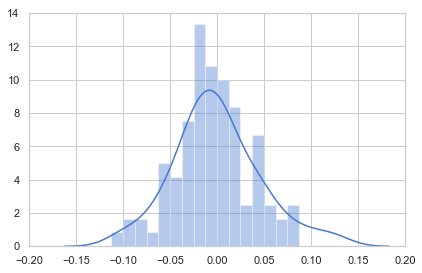

In [33]:
sns.distplot(points1, bins=np.linspace(-0.2, 0.1, 25))
plt.xlim((-0.2, 0.2))

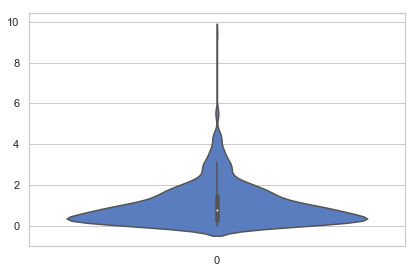

In [34]:
ax = sns.violinplot(data=values, orient="v")

### Последовательности

In [35]:
seq1 = [
    0.035753708,
    0.025425873,
    -0.02886173,
    -0.062208079,
    0.009859905,
    -0.029191028,
    0.015445348,
    -0.041167612,
    0.000661905,
    0.022037345,
    -0.022692465,
    -0.013708704,
    0.000864697,
    -0.00381506,
    0.00566126,
    0.046831302,
    -0.006634978,
    0.034566982,
    -0.020528213,
    -0.008776701,
    -0.025919141,
    0.015279487,
    0.018577796,
    -0.014132879,
    0.036607044,
    0.011353209,
    -0.040542021,
    -0.022105644,
    -0.014888368,
    0.007026745,
    -0.011494996,
    -0.041136038,
    -0.002631499,
    0.024654643,
    -0.03584061,
    0.017303168,
    0.001725406,
    0.004975853,
    0.000671759,
    -0.005891895,
    -0.013689039,
    0.002192959,
    0.007913215,
    -0.03852223,
    0.007958798,
    -0.007133473,
    0.011234009,
    -0.001410361,
]

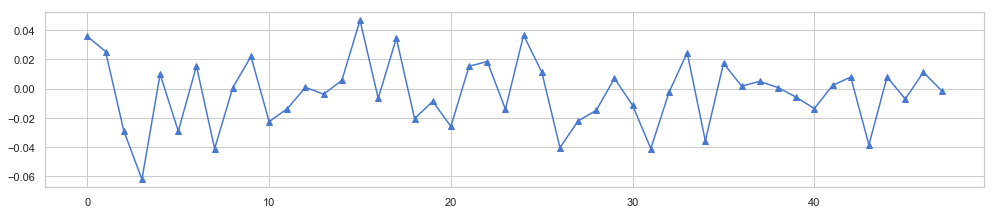

In [36]:
plt.figure(figsize=(15, 3))
plt.plot(seq1, "-^")
plt.grid(True)

<Container object of 3 artists>

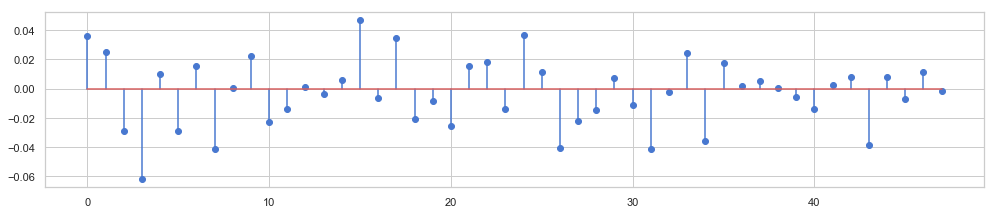

In [37]:
plt.figure(figsize=(15, 3))

# Stem plot
plt.stem(seq1)

<Container object of 48 artists>

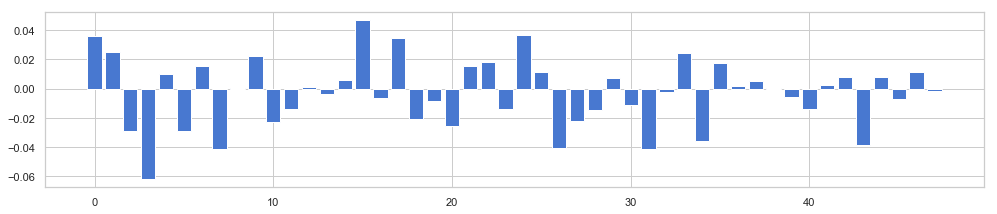

In [38]:
plt.figure(figsize=(15, 3))
plt.bar(arange(len(seq1)), seq1)

In [39]:
values = np.random.rand(50) - 0.5
index = ["feat.{}".format(i) for i in range(50)]

feat_df = pd.DataFrame(values, index=index, columns=["strength"])

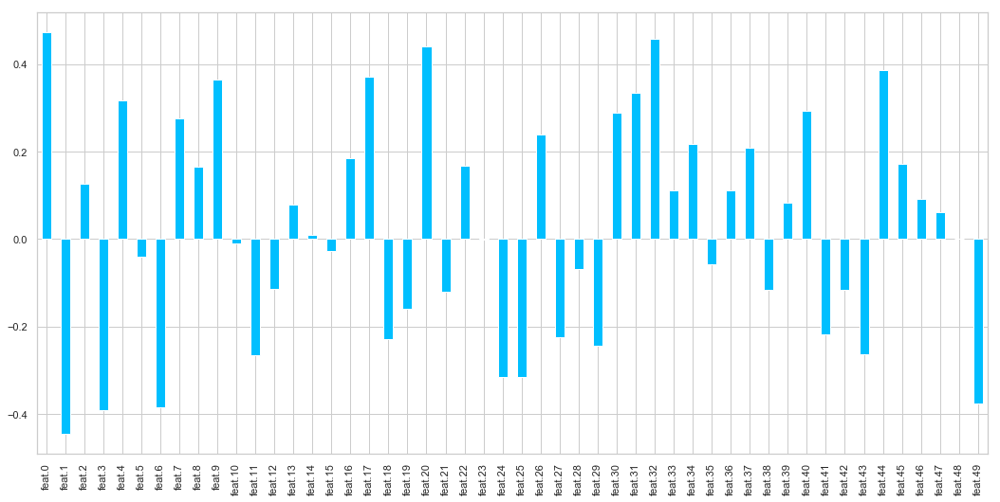

In [40]:
plt.figure(figsize=(16, 8))
feat_df["strength"].plot(kind="bar", color="deepskyblue")

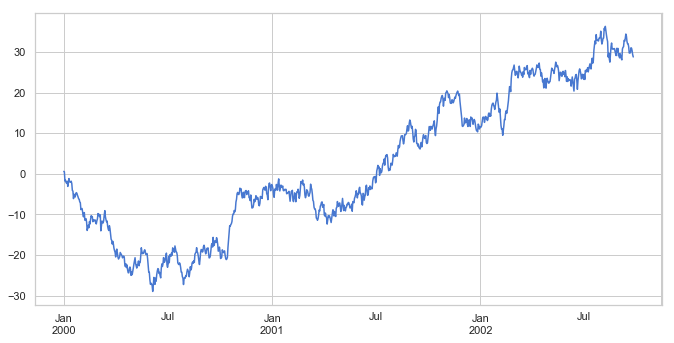

In [41]:
ts = pd.Series(np.random.randn(1000), index=pd.date_range("1/1/2000", periods=1000))
ts = ts.cumsum()
ts.plot(figsize=(10, 5))

## Ящик с усами (диаграмма размаха)


[Подробнее](https://ru.wikipedia.org/wiki/%D0%AF%D1%89%D0%B8%D0%BA_%D1%81_%D1%83%D1%81%D0%B0%D0%BC%D0%B8)

In [42]:
iris = datasets.load_iris()
data = pd.DataFrame(iris["data"], columns=iris["feature_names"])
target = iris["target"]

data.head(5)

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


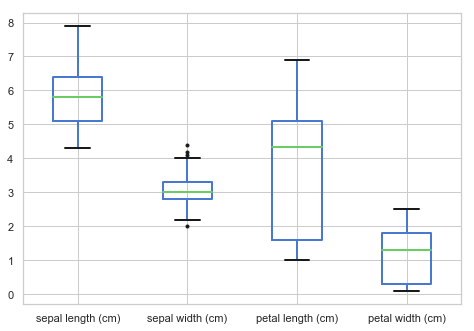

In [43]:
ax = data.boxplot(figsize=(7, 5), return_type="axes", sym="k.")
_ = plt.setp(ax.lines, linewidth=2.0)

### Violin plot 

Ящик с усами + KDE

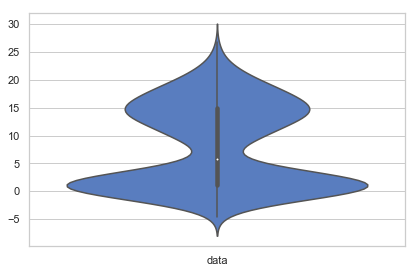

In [44]:
values = pd.DataFrame(
    np.concatenate((np.random.normal(1, 2, 1000), np.random.normal(15, 4, 1000))),
    columns=["data"],
)
ax = sns.violinplot(data=values, orient="v")

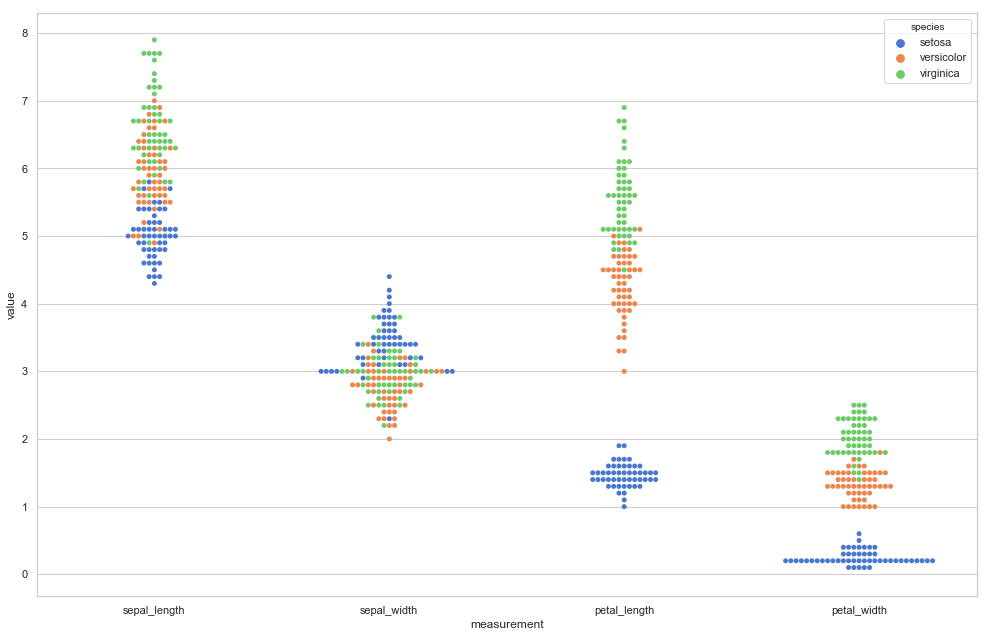

In [45]:
iris = sns.load_dataset("iris")
iris = pd.melt(iris, "species", var_name="measurement")

plt.figure(figsize=(15, 10))
sns.swarmplot(x="measurement", y="value", hue="species", data=iris)

### Фильтрация выбросов

(-16.08, 15.34)

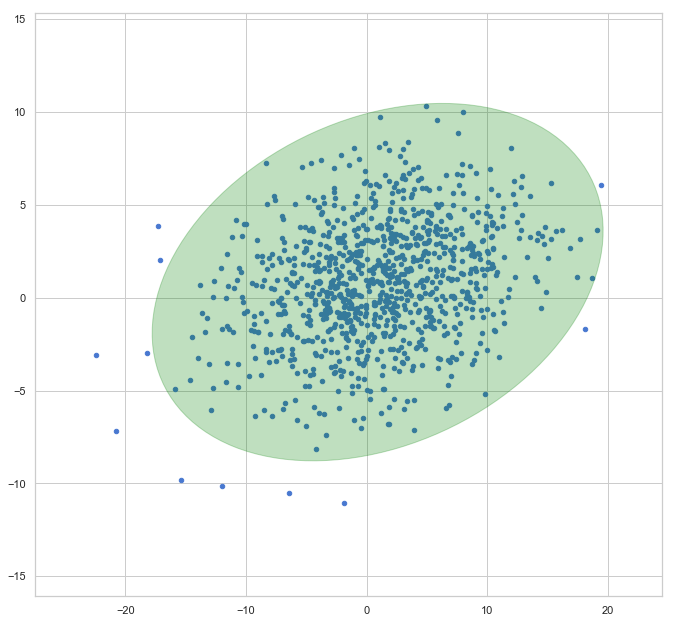

In [46]:
from matplotlib.patches import Ellipse


def plot_point_cov(points, nstd=2, ax=None, **kwargs):
    pos = points.mean(axis=0)
    cov = np.cov(points, rowvar=False)
    return plot_cov_ellipse(cov, pos, nstd, ax, **kwargs)


def plot_cov_ellipse(cov, pos, nstd=2, ax=None, **kwargs):
    def eigsorted(cov):
        vals, vecs = np.linalg.eigh(cov)
        order = vals.argsort()[::-1]
        return vals[order], vecs[:, order]

    if ax is None:
        ax = plt.gca()

    vals, vecs = eigsorted(cov)
    theta = np.degrees(np.arctan2(*vecs[:, 0][::-1]))

    width, height = 2 * nstd * np.sqrt(vals)
    ellip = Ellipse(xy=pos, width=width, height=height, angle=theta, **kwargs)

    ax.add_artist(ellip)
    return ellip


points = np.random.multivariate_normal(mean=(1, 1), cov=[[40, 5], [5, 10]], size=1000)

x, y = points.T
figure(figsize=(10, 10))
plt.scatter(x, y, s=20)


plot_point_cov(points, nstd=3, alpha=0.25, color="green")
plt.xlim((min(x) - 5, max(x) + 5))
plt.ylim((min(y) - 5, max(y) + 5))

### Циклические данные

Данные, имеющие циклическую природу (дни недели, месяца, часы в сутках), удобно изображать на круговых диаграммах

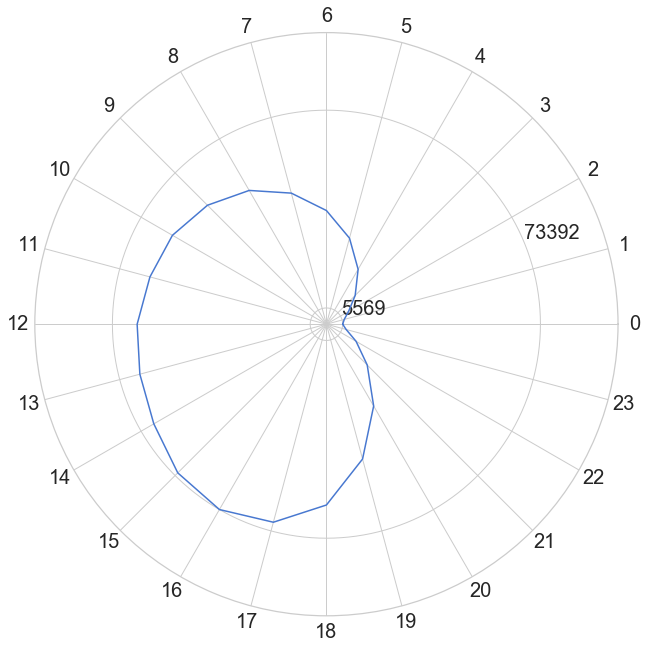

In [47]:
r = np.array(
    [
        5569,
        6336,
        8765,
        13942,
        21739,
        30555,
        38981,
        46536,
        52970,
        57691,
        60975,
        62658,
        64911,
        66239,
        68352,
        72098,
        73392,
        70308,
        62004,
        47871,
        32396,
        19780,
        11740,
        7008,
        5569,
    ]
)
theta = [2 * np.pi * i / 24 for i in range(25)]

fig = plt.figure(figsize=(10, 10), facecolor="white")
axes = plt.subplot(111, polar=True, axisbg="white")

axes.set_xticklabels(arange(24).astype(str))
axes.set_xticks(np.pi / 180.0 * np.linspace(0, 360, 24, endpoint=False))
axes.set_yticks([min(r), max(r)])
axes.set_ylim((0, 100000))
axes.tick_params(axis="both", which="major", labelsize=20)

axes.plot(theta, r)

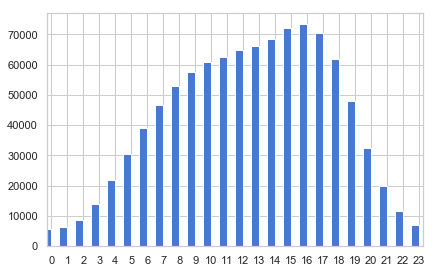

In [48]:
plt.bar(arange(24) - 0.25, r[:-1], 0.5, 0)
plt.xlim((-0.25, 23.25))
_ = plt.xticks(np.linspace(0, 23, 24))

## Scatter Matrix - скаттеры для каждой пары признаков

In [49]:
iris = datasets.load_iris()
diabetes = datasets.load_diabetes()

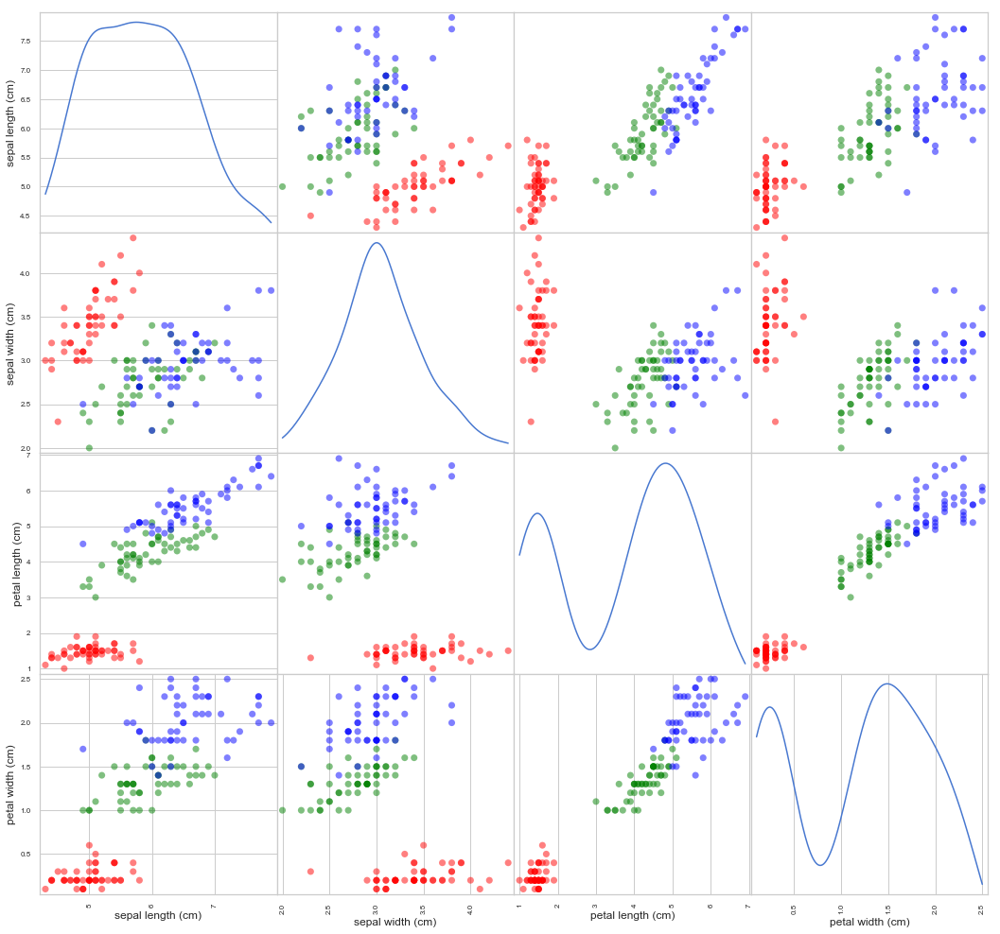

In [50]:
from pandas.tools.plotting import scatter_matrix

c = ["red", "green", "blue"]
colors = [c[i] for i in iris["target"]]
iris = datasets.load_iris()
_ = scatter_matrix(
    pd.DataFrame(iris["data"], columns=iris["feature_names"]),
    figsize=(16, 16),
    diagonal="kde",
    c=colors,
    s=200,
)

### Трехмерный scatter

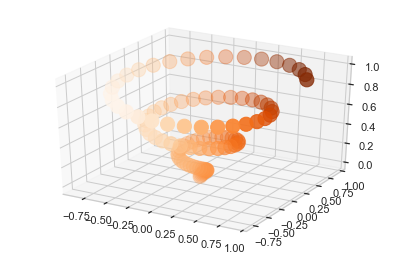

In [51]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = plt.axes(projection="3d")

z = np.linspace(0, 1, 100)
x = z * np.sin(20 * z)
y = z * np.cos(20 * z)

c = x + y

ax.scatter(x, y, z, c=c, s=200, cmap=cm.Oranges)

### Данные какой размерности можно представить одним двумерным скаттер-плотом?

* координата X
* координата Y
* цвет
* размер 
* форма
* прозрачность

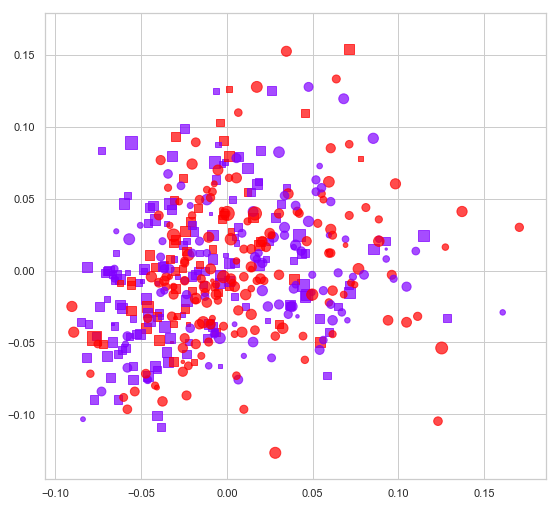

In [52]:
figure(figsize=(8, 8))

feature = diabetes.data[:, 5]
s = 200 * ((feature - min(feature)) / (max(feature) - min(feature)))

feature2 = diabetes.data[:, 6] > 0

scatter(
    diabetes.data[feature2, 2],
    diabetes.data[feature2, 4],
    c=diabetes.data[feature2, 1],
    s=s,
    cmap="rainbow",
    marker="s",
    alpha=0.7,
)
scatter(
    diabetes.data[logical_not(feature2), 2],
    diabetes.data[logical_not(feature2), 4],
    c=diabetes.data[logical_not(feature2), 1],
    s=s,
    cmap="rainbow",
    marker="o",
    alpha=0.7,
)

### Дискретные признаки и scatter

In [53]:
f = (diabetes.data[:, 3] - min(diabetes.data[:, 3])) * 4
feature = zeros(len(f))
feature[f > 0.2] = 1
feature[f > 0.4] = 2
feature[f > 0.6] = 3
feature[f > 0.8] = 4

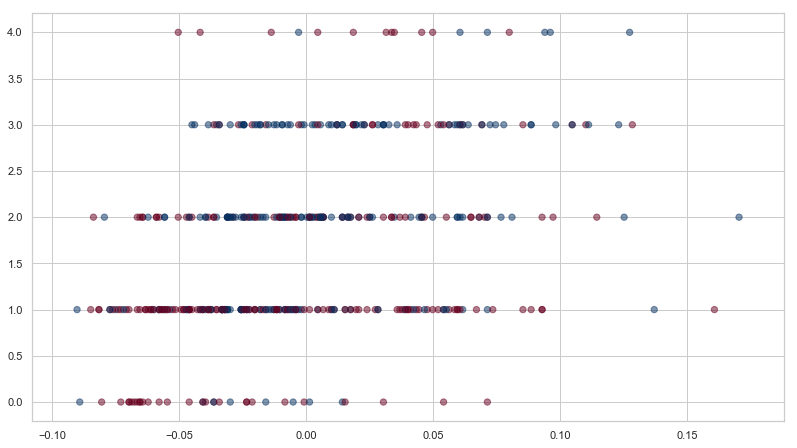

In [54]:
figure(figsize=(12, 7))
scatter(
    diabetes.data[:, 2], feature, alpha=0.5, c=diabetes.data[:, 1], s=40, cmap=cm.RdBu
)
grid(True)

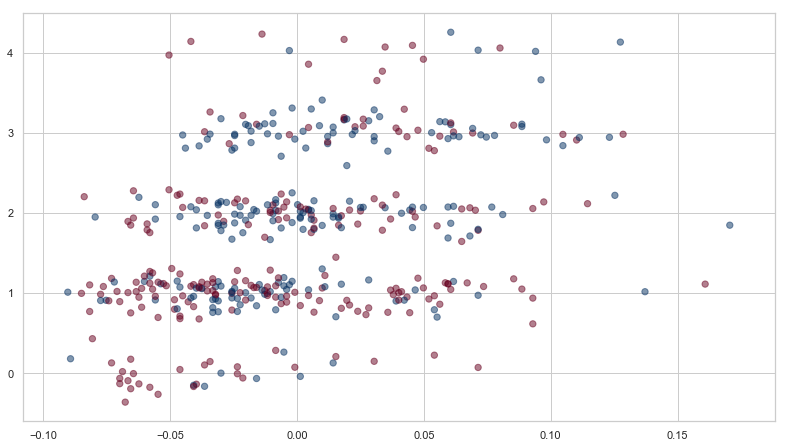

In [55]:
figure(figsize=(12, 7))
scatter(
    diabetes.data[:, 2],
    feature + 0.15 * randn(len(feature)),
    alpha=0.5,
    c=diabetes.data[:, 1],
    s=40,
    cmap=cm.RdBu,
)
grid(True)

## Сохранение картинок

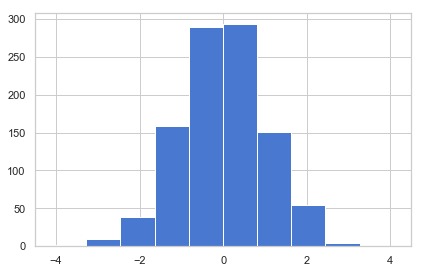

In [56]:
plt.hist(np.random.randn(1000))

plt.savefig("my_hist.png")

In [57]:
!ls -l my_hist.png

-rw-r--r--  1 klunev  LD\Domain Users  5774 13 фев 18:35 my_hist.png


## Cross-validation

Изобразим качество нашей модели в зависимости от значений параметра

In [58]:
from sklearn.datasets import load_digits
from sklearn.neighbors import KNeighborsClassifier


digits = load_digits()
X, y = digits.data.astype(int), digits.target.astype(int)

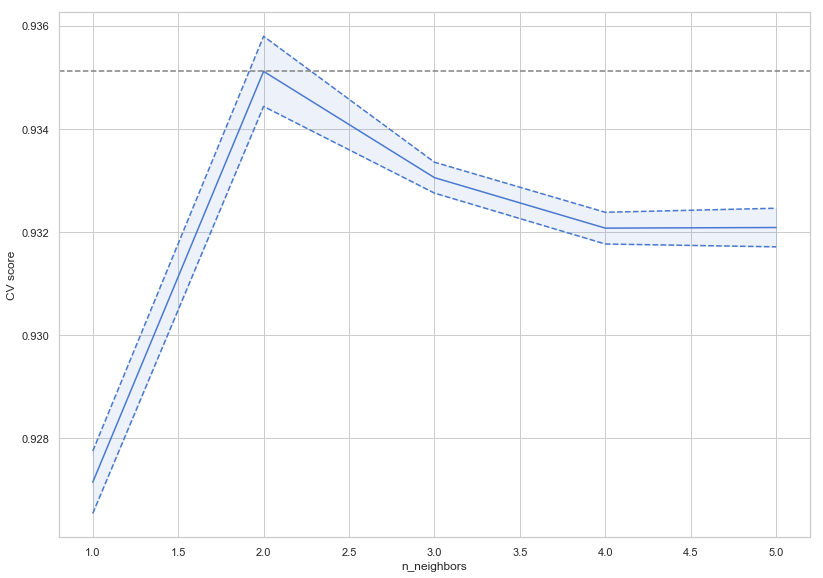

In [59]:
from sklearn import cross_validation, datasets, linear_model

Xs = X[:1000]
ys = y[:1000]
knn = KNeighborsClassifier()
params = np.linspace(1, 5, 5, dtype=int)

scores = list()
scores_std = list()

for par in params:
    knn.n_neighbors = par
    this_scores = cross_validation.cross_val_score(knn, Xs, ys, n_jobs=1)
    scores.append(np.mean(this_scores))
    scores_std.append(np.std(this_scores))

plt.figure(figsize=(12, 9))
plt.plot(params, scores)

upper = np.array(scores) + np.array(scores_std) / np.sqrt(len(Xs))
lower = np.array(scores) - np.array(scores_std) / np.sqrt(len(Xs))

plt.plot(params, upper, "b--")
plt.plot(params, lower, "b--")
plt.fill_between(params, lower, upper, alpha=0.1, color="b")
plt.ylabel("CV score")
plt.xlabel("n_neighbors")
plt.axhline(np.max(scores), linestyle="--", color=".5")

plt.show()

##  Learning curve

Посмотрим как растет качество при увеличении размера обучающей выборки

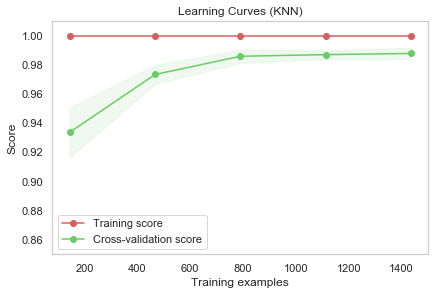

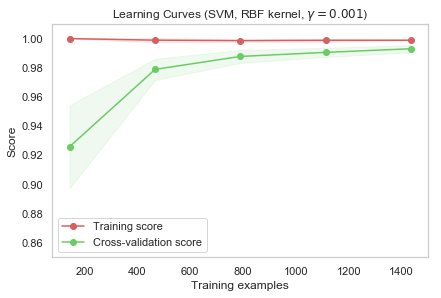

In [60]:
from sklearn import cross_validation
from sklearn.svm import SVC
from sklearn.learning_curve import learning_curve


def plot_learning_curve(
    estimator,
    title,
    X,
    y,
    ylim=None,
    cv=None,
    n_jobs=1,
    train_sizes=np.linspace(0.1, 1.0, 5),
):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")

    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes
    )

    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.1,
        color="g",
    )
    plt.plot(train_sizes, train_scores_mean, "o-", color="r", label="Training score")
    plt.plot(
        train_sizes, test_scores_mean, "o-", color="g", label="Cross-validation score"
    )

    plt.legend(loc="best")
    return plt


title = "Learning Curves (KNN)"
cv = cross_validation.ShuffleSplit(
    digits.data.shape[0], n_iter=10, test_size=0.2, random_state=0
)

estimator = KNeighborsClassifier(n_neighbors=1)
plot_learning_curve(estimator, title, X, y, ylim=(0.85, 1.01), cv=cv, n_jobs=4)

title = "Learning Curves (SVM, RBF kernel, $\gamma=0.001$)"
cv = cross_validation.ShuffleSplit(
    digits.data.shape[0], n_iter=10, test_size=0.2, random_state=0
)
estimator = SVC(gamma=0.001)
plot_learning_curve(estimator, title, X, y, (0.85, 1.01), cv=cv, n_jobs=4)

plt.show()

## Сравнение алгоритмов

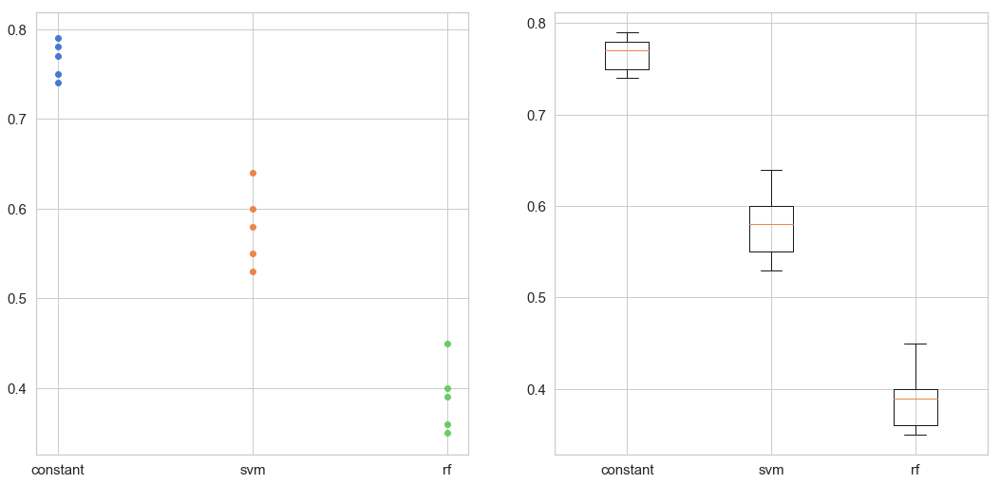

In [61]:
def show_scores(model_names, cv_scores):
    fig, axs = subplots(1, 2, figsize=(16, 8))
    for ax in axs:
        ax.set_xticks(arange(len(model_names)))
        ax.set_xticklabels(model_names)
        ax.grid(True)
        ax.tick_params(axis="both", which="major", labelsize=15)
    for i, (model_name, model_scores) in enumerate(zip(model_names, cv_scores)):
        axs[0].scatter(len(model_scores) * [i], model_scores)
    _ = axs[1].boxplot([model_scores for model_scores in cv_scores])
    axs[1].set_xticklabels(model_names)
    axs[1].tick_params(axis="both", which="major", labelsize=15)


model_names = ["constant", "svm", "rf"]
cv_scores = [
    [0.75, 0.74, 0.78, 0.77, 0.79],
    [0.55, 0.58, 0.53, 0.60, 0.64],
    [0.35, 0.45, 0.4, 0.36, 0.39],
]

show_scores(model_names, cv_scores)

### Динамическое построение графиков

<IPython.core.display.Javascript object>


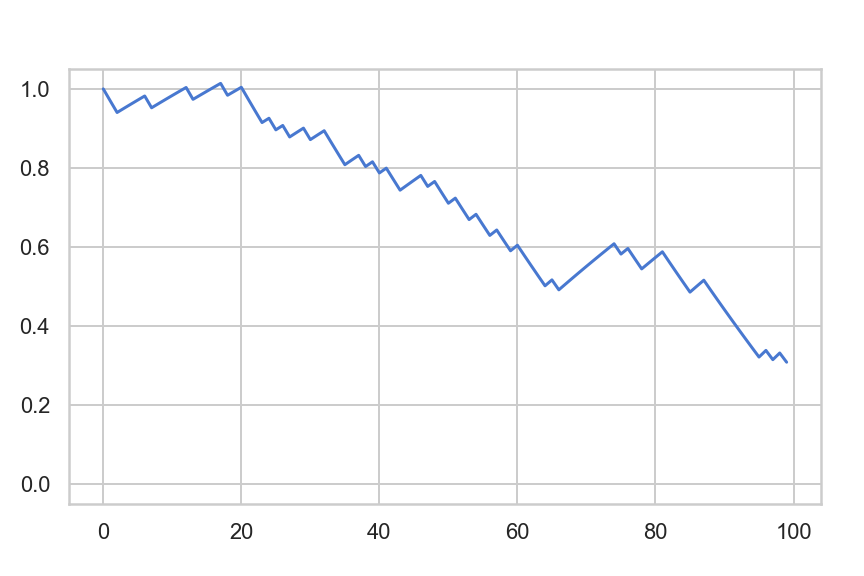

In [78]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

%matplotlib notebook


def compute_error(prev_error):
    # долгий процесс обучения модели
    np.std(np.random.rand(10000000))
    # вычисление ошибки
    error_level = prev_error * 0.99 + np.random.choice([-0.02, 0.02])

    return error_level


fig, ax = plt.subplots()

errors = np.zeros(100)
errors[0] = 1.0

(line,) = ax.plot(errors)


def animate(i):
    errors[i] = compute_error(errors[i - 1])
    line.set_ydata(errors)
    return (line,)


ani = animation.FuncAnimation(
    fig, animate, np.arange(1, 200), interval=10, repeat=False
)
plt.show()

### Логирование процесса

<img src="https://pp.userapi.com/c841038/v841038634/4cb4a/oQqggELJBrQ.jpg" alt="Drawing" style="width: 500px;"/>

[источник](https://vk.com/weirdreparametrizationtrick)

In [63]:
from tqdm import tqdm

for i in tqdm(range(100)):
    compute_error(0)

100%|██████████| 100/100 [00:19<00:00,  5.03it/s]


In [64]:
from tqdm import tqdm_notebook

for i in tqdm_notebook(range(100)):
    compute_error(0)

HBox(children=(IntProgress(value=0), HTML(value=u'')))

## Plot.ly

[Plot.ly](https://plot.ly/python/) - библиотека, которая умеет рисовать интерактивные графики, что делает их очень наглядными.

Имеется два режима: offline и online. Особенности онлайн режима:
  - Онлайн позволяет хранить ваши графики на серверах plot.ly и получать их по урлу
  - Чтобы воспользоваться, необходимо завести аккаунт и получить ключик
  - Для бесплатного аккаунта действует ряд ограничений (число запросов в день, число хранимых на сервере графиков)
  - Для бесплатного аккаунта все графики публично доступны

Оффлайн режим работает оффлайн и ничем не ограничивается. Будем использовать его.

In [65]:
import cufflinks as cf
import plotly
import plotly.offline as py
import plotly.graph_objs as go

cf.go_offline()  # required to use plotly offline (no account required).
py.init_notebook_mode()  # graphs charts inline (IPython).

cufflinks - библиотека, которая патчит pandas, чтобы датафреймы научились строить plot.ly-графики 

In [66]:
df = cf.datagen.lines()
df.head()

,MOO.AQ,UPK.MA,HED.JH,IEC.XP,IJR.DJ
2015-01-01,-1.177698,-0.907180,0.409279,-1.316146,-1.110969
2015-01-02,0.212735,-1.694419,0.954902,0.215859,-1.814309
2015-01-03,0.326799,-3.881547,0.330471,-0.789670,-1.045582
2015-01-04,-0.394075,-3.143249,0.445969,-1.262222,-1.223249
2015-01-05,-0.089840,-2.076438,-0.401379,-0.691006,-1.663108


In [67]:
df.iplot(kind="scatter")

### [Plot.ly и Pandas](https://plot.ly/pandas/)

cufflinks - библиотека, которая патчит pandas, чтобы датафреймы научились строить plot.ly-графики 

In [68]:
import cufflinks as cf

In [69]:
df = cf.datagen.lines()

In [70]:
df.head()

,RLR.HD,RBR.UW,YER.OW,FFK.IP,PFV.CH
2015-01-01,2.118181,-0.742807,0.772717,-0.801517,0.617755
2015-01-02,2.103254,-0.457507,0.540414,-1.741524,0.643220
2015-01-03,2.255592,0.132497,0.436480,-2.770759,0.408956
2015-01-04,0.850779,-0.635146,-0.446786,-3.024176,-0.587970
2015-01-05,0.721495,-0.586179,1.572144,-1.015774,1.694615


In [71]:
df.iplot(kind="scatter", filename="cf-simple-line")

### 2D Density Plot

In [72]:
import plotly.figure_factory as ff

t = np.linspace(-1, 1.2, 2000)
x = (t**3) + (0.3 * np.random.randn(2000))
y = (t**6) + (0.3 * np.random.randn(2000))

colorscale = ["#7A4579", "#D56073", "rgb(236,158,105)", (1, 1, 0.2), (0.98, 0.98, 0.98)]

fig = ff.create_2d_density(
    x, y, colorscale=colorscale, hist_color="rgb(255, 237, 222)", point_size=3
)

py.iplot(fig)

###  Violin plot

In [73]:
np.random.seed(619517)
Nr = 250
y = np.random.randn(Nr)
gr = np.random.choice(list("ABCDE"), Nr)
norm_params = [(0, 1.2), (0.7, 1), (-0.5, 1.4), (0.3, 1), (0.8, 0.9)]

for i, letter in enumerate("ABCDE"):
    y[gr == letter] *= norm_params[i][1] + norm_params[i][0]
df = pd.DataFrame(dict(Score=y, Group=gr))
df.head(10)

,Group,Score
0,B,1.656178
1,C,-1.379259
2,C,1.567691
3,B,1.484571
4,E,0.410634
5,E,1.499139
6,C,-0.230265
7,A,-1.112525
8,A,-1.625357
9,B,-0.834805


In [74]:
data_header = "Score"
group_header = "Group"

group_stats = {}
groupby_data = df.groupby([group_header])

for group in "ABCDE":
    data_from_group = groupby_data.get_group(group)[data_header]
    stat = np.median(data_from_group)
    group_stats[group] = stat

fig = ff.create_violin(
    df,
    data_header="Score",
    group_header="Group",
    colors="YlOrRd",
    height=500,
    width=800,
    use_colorscale=True,
    group_stats=group_stats,
)
py.iplot(fig, filename="Violin Plots with Colorscale")

### Добавим интерактивности при помощи слайдеров

In [75]:
data = [
    dict(
        visible=False,
        line=dict(color="00CED1", width=6),
        name="𝜈 = " + str(step),
        x=np.arange(0, 10, 0.01),
        y=np.sin(step * np.arange(0, 10, 0.01)),
    )
    for step in np.arange(0, 5, 0.1)
]
data[10]["visible"] = True

steps = []
for i in range(len(data)):
    step = dict(
        method="restyle",
        args=["visible", [False] * len(data)],
    )
    step["args"][1][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [
    dict(active=10, currentvalue={"prefix": "Frequency: "}, pad={"t": 50}, steps=steps)
]

layout = dict(sliders=sliders)

fig = dict(data=data, layout=layout)

py.iplot(fig, filename="Sine Wave Slider")

### Старайтесь пользоваться высокоуровневыми библиотеками (seaborn, plot.ly и другими). Почти все они базируются на matplotlib и используют его принципы, так что в нем тоже стоит разобраться.

## Как не стоит делать 

![](https://i.imgur.com/tXyZbfn.png)
![](https://i.imgur.com/tJc5q5N.png)
![](https://i.imgur.com/IKCrwbq.png)
![](https://i.imgur.com/xSDUf3H.png)

#                      Data visualization is critical for finding insights

 
  

 ![](http://numeralis.ru/wp-content/uploads/2013/04/17921_574029389282656_1953429470_n.jpg)